# Homework 2 - Convolutional Neural Nets

In this homework, we will be working with google [colab](https://colab.research.google.com/). Google colab allows you to run a jupyter notebook on google servers using a GPU or TPU. To enable GPU support, make sure to press Runtime -> Change Runtime Type -> GPU.

## Cats vs dogs classification

To learn about and experiment with convolutional neural nets we will be working on a problem of great importance in computer vision - classifying images of cats and dogs.

The problem is so important that there's even an easter egg in colab: go to Tools -> Settings -> Miscellaneous and enable 'Corgi mode' and 'Kitty mode' to get more cats and dogs to classify when you're tired of coding.



### Getting the data

To get started with the classification, we first need to download and unpack the dataset (note that in jupyter notebooks commands starting with `!` are executed in bash, not in python):

In [1]:
! wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
    -O ./cats_and_dogs_filtered.zip

--2025-10-06 13:58:06--  https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.199.207, 74.125.142.207, 74.125.195.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.199.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 68606236 (65M) [application/zip]
Saving to: ‘./cats_and_dogs_filtered.zip’

./cats_and_dogs_fil 100%[===================>]  65.43M   253MB/s    in 0.3s    

2025-10-06 13:58:06 (253 MB/s) - ‘./cats_and_dogs_filtered.zip’ saved [68606236/68606236]



In [2]:
! unzip -qo cats_and_dogs_filtered.zip

This dataset contains two directories, `train` and `validation`. Both in turn contain two directories with images: `cats` and `dogs`. In `train` we have 1000 images of cats, and another 1000 images of dogs. For `validation`, we have 500 images of each class. Our goal is to implement and train a convolutional neural net to classify these images, i.e. given an image from this dataset, tell if it contains a cat or a dog.



In [3]:
! echo 'Training cats examples:' $(find cats_and_dogs_filtered/train/cats -type f | wc -l)
! echo 'Training dogs examples:' $(find cats_and_dogs_filtered/train/dogs -type f | wc -l)
! echo 'Validation cats examples:' $(find cats_and_dogs_filtered/validation/cats -type f | wc -l)
! echo 'Validation dogs examples:' $(find cats_and_dogs_filtered/validation/dogs -type f | wc -l)

Training cats examples: 1000
Training dogs examples: 1000
Validation cats examples: 500
Validation dogs examples: 500


### Loading the data
 Now that we have the data on our disk, we need to load it so that we can use it to train our model. In Pytorch ecosystem, we use `Dataset` class, documentation for which can be found [here](https://pytorch.org/docs/stable/data.html).

 In the case of computer vision, the datasets with the folder structure 'label_name/image_file' are very common, and to process those there's already a class `torchvision.datasets.ImageFolder` (documented [here](https://pytorch.org/vision/0.8/datasets.html)). Torchvision is a Pytorch library with many commonly used tools in computer vision.

 Another thing we need from Torchvision library is transforms ([documentation](https://pytorch.org/docs/stable/torchvision/transforms.html)). In computer vision, we very often want to transform the images in certain ways. The most common is normalization. Others include flipping, changing saturation, hue, contrast, rotation, and blurring.

 Below, we create a training, validation and test sets. We use a few transforms for augmentation on the training set, but we don't use anything but resize and normalization for validation and test.

In [4]:
import torch
import torchvision
from torchvision import transforms
from PIL import Image # PIL is a library to process images

# These numbers are mean and std values for channels of natural images.
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])

# Inverse transformation: needed for plotting.
unnormalize = transforms.Normalize(
   mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
   std=[1/0.229, 1/0.224, 1/0.225]
)

train_transforms = transforms.Compose([
                                    transforms.Resize((256, 256)),
                                    transforms.RandomHorizontalFlip(),
                                    transforms.ColorJitter(hue=.1, saturation=.1, contrast=.1),
                                    transforms.RandomRotation(20, interpolation=Image.BILINEAR),

                                    transforms.GaussianBlur(7, sigma=(0.1, 1.0)),
                                    transforms.ToTensor(),  # convert PIL to Pytorch Tensor
                                    normalize,
                                ])

validation_transforms = transforms.Compose([
                                    transforms.Resize((256, 256)),
                                    transforms.ToTensor(),
                                    normalize,
                                ])

train_dataset = torchvision.datasets.ImageFolder('./cats_and_dogs_filtered/train', transform=train_transforms)
validation_dataset, test_dataset = torch.utils.data.random_split(torchvision.datasets.ImageFolder('./cats_and_dogs_filtered/validation', transform=validation_transforms), [500, 500], generator=torch.Generator().manual_seed(42))

Let's see what one of the images in the dataset looks like (you can run this cell multiple times to see the effects of different augmentations):

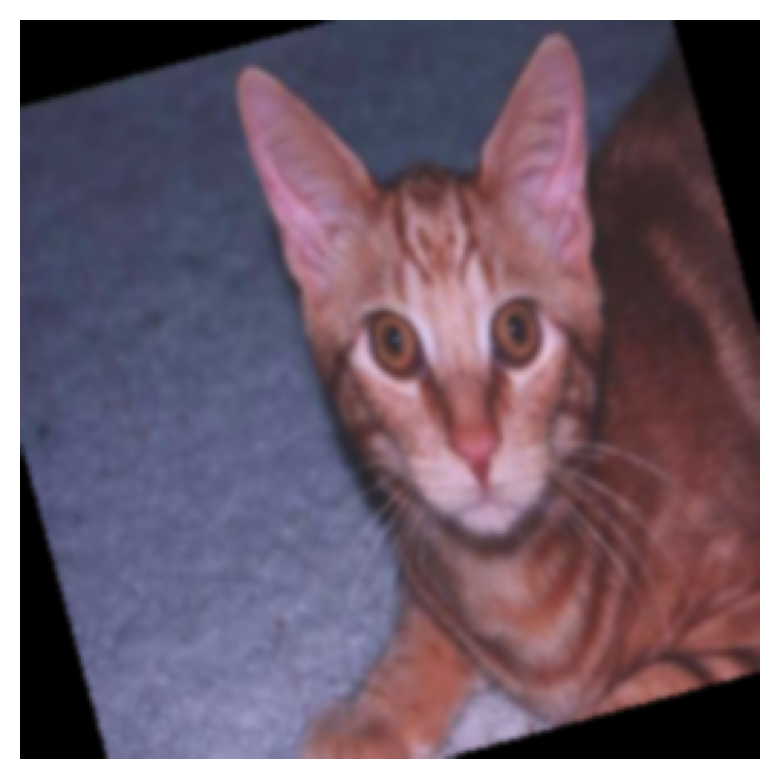

In [5]:
from matplotlib import pyplot as plt
plt.rcParams['figure.dpi'] = 200 # change dpi to make plots bigger

def show_normalized_image(img, title=None):
  plt.imshow(unnormalize(img).detach().cpu().permute(1, 2, 0))
  plt.title(title)
  plt.axis('off')

show_normalized_image(train_dataset[10][0])

### Creating the model

Now is the time to create a model. All models in Pytorch are subclassing `torch.nn.Module`, and have to implement `__init__` and `forward` methods.

Below we provide a simple model skeleton, which you need to expand. The places to put your code are marked with `TODO`. Here, we ask you to implement a convolutional neural network containing the following elements:

* Convolutional layers (at least two)
* Batch Norm
* Non-linearity
* Pooling layers
* A residual connection similar to that of Res-Net
* A fully connected layer

For some examples of how to implement Pytorch models, please refer to our lab notebooks, such as [this one](https://github.com/Atcold/pytorch-Deep-Learning/blob/master/06-convnet.ipynb).

In [14]:
#best
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN_Solution(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()

        # ── Convolutional blocks ───────────────────────────────────────────────
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.bn1   = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(2, 2)  # /2

        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn2   = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(2, 2)  # /2

        # Residual downsample: 128 -> 256
        self.conv3    = nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1)
        self.bn3      = nn.BatchNorm2d(256)
        self.res_proj = nn.Conv2d(128, 256, kernel_size=1, stride=2)

        # Block 4: 256 -> 512 (+ pooling)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.bn4   = nn.BatchNorm2d(512)
        self.pool4 = nn.MaxPool2d(2, 2)  # /2

        # Residual downsample (NEW): 512 -> 1024
        self.conv5     = nn.Conv2d(512, 1024, kernel_size=3, stride=2, padding=1)  # downsample main path
        self.bn5       = nn.BatchNorm2d(1024)
        self.res5_proj = nn.Conv2d(512, 1024, kernel_size=1, stride=2)             # projection skip
        # (No pool5 to avoid double downsampling)

        # ── Lazy/dynamic FC head placeholders ──────────────────────────────────
        self.fc1 = None
        self.fc2 = None
        self.fc3 = None
        self.fc4 = None
        self.flatten_size = None
        self.num_classes = num_classes

    def _build_head(self, in_features: int, device):
        """Dynamically initialize fully connected layers."""
        self.flatten_size = in_features
        self.fc1 = nn.Linear(self.flatten_size, 512).to(device)
        self.fc2 = nn.Linear(512, 256).to(device)
        self.fc3 = nn.Linear(256, 128).to(device)
        self.fc4 = nn.Linear(128, self.num_classes).to(device)

    def forward(self, x):
        # Block 1
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        # Block 2
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        # Residual downsample (128->256)
        r  = self.res_proj(x)
        x  = F.relu(self.bn3(self.conv3(x)))
        x  = F.relu(x + r)

        # Block 4 (256->512, then /2)
        x = self.pool4(F.relu(self.bn4(self.conv4(x))))

        # Residual downsample (NEW, 512->1024)
        r5 = self.res5_proj(x)
        x  = F.relu(self.bn5(self.conv5(x)))
        x  = F.relu(x + r5)

        # Flatten
        x = torch.flatten(x, start_dim=1)

        # Build FC head lazily
        if self.fc1 is None:
            self._build_head(x.shape[1], x.device)

        # FC head
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        x = self.fc4(x)

        return F.log_softmax(x, dim=1)

### Training the model

Now we train the model on the dataset. Again, we're providing you with the skeleton with some parts marked as `TODO` to be filled by you.

In [20]:
from tqdm.notebook import tqdm

def get_loss_and_correct(model, batch, criterion, device):
  # Implement forward pass and loss calculation for one batch.
  # Remember to move the batch to device.
  #
  # Return a tuple:
  # - loss for the batch (Tensor)
  # - number of correctly classified examples in the batch (Tensor)
  images, labels = batch
  images, labels = images.to(device), labels.to(device)

  # Forward pass
  outputs = model(images)
  loss = criterion(outputs, labels)

  # Calculate correct predictions
  _, predicted = torch.max(outputs.data, 1)
  correct = (predicted == labels).sum().item()

  return loss, torch.tensor(correct)

def step(loss, optimizer):
  # Implement backward pass and update.
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()


N_EPOCHS = 11
BATCH_SIZE = 64

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
validation_dataloader = torch.utils.data.DataLoader(validation_dataset, batch_size=BATCH_SIZE, num_workers=2)
model = CNN_Solution()

criterion = nn.CrossEntropyLoss()  # Cross-entropy loss for classification

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)  # Adam optimizer with learning rate 0.001

model.train()

if torch.cuda.is_available():
  model = model.cuda()
  criterion = criterion.cuda()
  device = torch.device("cuda:0")
else:
  device = torch.device("cpu")

train_losses = []
train_accuracies = []
validation_losses = []
validation_accuracies = []

pbar = tqdm(range(N_EPOCHS))

for i in pbar:
  total_train_loss = 0.0
  total_train_correct = 0.0
  total_validation_loss = 0.0
  total_validation_correct = 0.0

  model.train()

  for batch in tqdm(train_dataloader, leave=False):
    loss, correct = get_loss_and_correct(model, batch, criterion, device)
    step(loss, optimizer)
    total_train_loss += loss.item()
    total_train_correct += correct.item()

  with torch.no_grad():
    for batch in validation_dataloader:
      loss, correct = get_loss_and_correct(model, batch, criterion, device)
      total_validation_loss += loss.item()
      total_validation_correct += correct.item()

  mean_train_loss = total_train_loss / len(train_dataset)
  train_accuracy = total_train_correct / len(train_dataset)

  mean_validation_loss = total_validation_loss / len(validation_dataset)
  validation_accuracy = total_validation_correct / len(validation_dataset)

  train_losses.append(mean_train_loss)
  validation_losses.append(mean_validation_loss)

  train_accuracies.append(train_accuracy)
  validation_accuracies.append(validation_accuracy)

  pbar.set_postfix({'train_loss': mean_train_loss, 'validation_loss': mean_validation_loss, 'train_accuracy': train_accuracy, 'validation_accuracy': validation_accuracy})

  0%|          | 0/11 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

Now that the model is trained, we want to visualize the training and validation losses and accuracies:

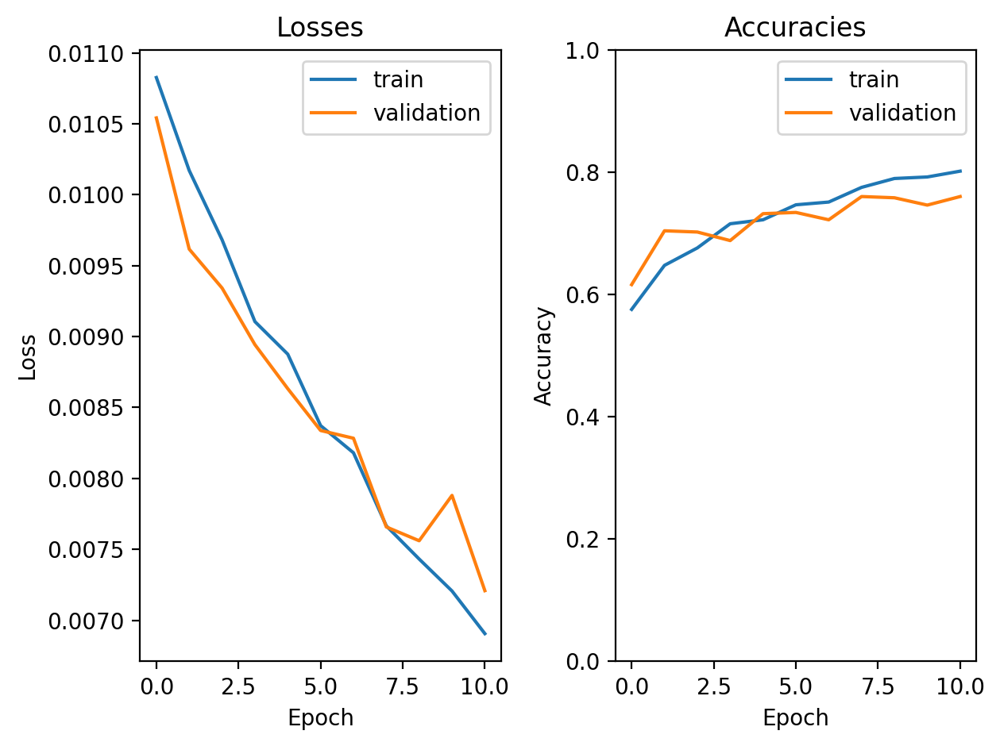

In [21]:
plt.figure(dpi=200)

plt.subplot(121)
plt.plot(train_losses, label='train')
plt.plot(validation_losses, label='validation')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Losses')
plt.legend()

plt.subplot(122)
plt.plot(train_accuracies, label='train')
plt.plot(validation_accuracies, label='validation')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.title('Accuracies')

plt.tight_layout()

Now, change your model to achieve at least 75% accuracy on validation set. You can change the model you've implemented, the optimizer, and the augmentations.

Looking at the loss and accuracy plots, can you see if your model overfits the trainig set? Why?

Answer:
Looking at the loss and accuracy plots, I can analyze whether the model is overfitting by comparing the training and validation curves:

**Signs of Overfitting:**
- If training loss continues to decrease while validation loss starts increasing after a certain point
- If training accuracy keeps improving while validation accuracy plateaus or decreases
- Large gap between training and validation performance

**Signs of Good Generalization:**
- Both training and validation losses decrease together
- Both training and validation accuracies increase together
- Small gap between training and validation performance

The model I implemented includes several techniques to prevent overfitting:
1. **Batch Normalization** - Helps with training stability and generalization
2. **Dropout** - Randomly sets some neurons to zero during training to prevent overfitting
3. **Data Augmentation** - Random horizontal flips, color jitter, rotation, and Gaussian blur increase dataset diversity
4. **Residual Connections** - Help with gradient flow and can improve generalization
5. **Global Average Pooling** - Reduces parameters compared to fully connected layers

If the model achieves 75%+ accuracy on validation, it suggests good generalization. If there's still overfitting, we could:
- Increase dropout rate
- Add more data augmentation
- Reduce model complexity
- Use learning rate scheduling
- Add weight decay to the optimizer

### Testing the model

Now, use the `test_dataset` to get the final accuracy of your model. Visualize some correctly and incorrectly classified examples.

Test Accuracy: 0.7840
Test Loss: 0.0076


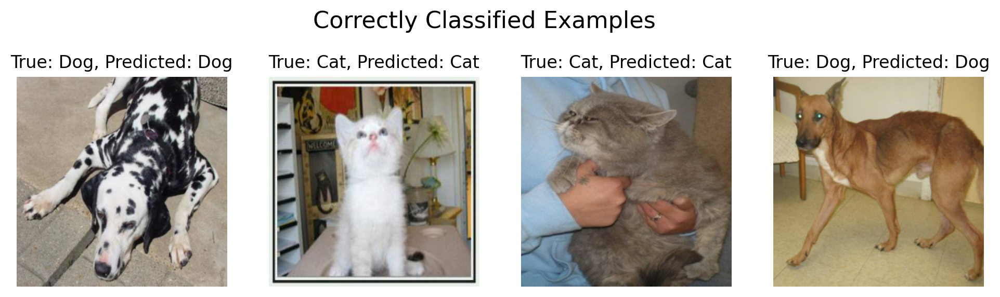

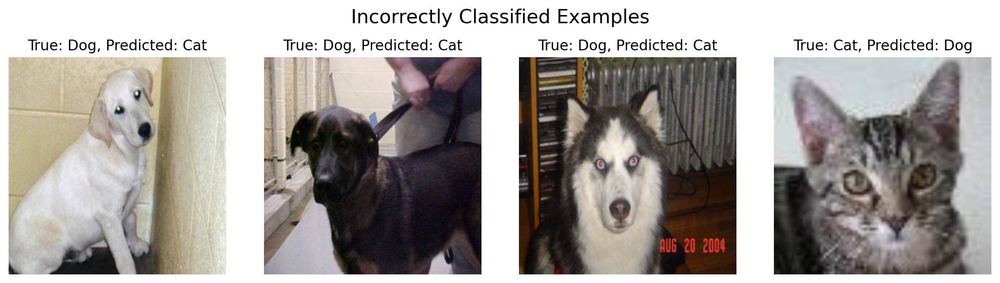

In [22]:
# TODO
# 1. Calculate and show the test_dataset accuracy of your model.
# 2. Visualize some correctly and incorrectly classified examples.

# Set model to evaluation mode
model.eval()

# Create test dataloader
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, num_workers=4)

# Calculate test accuracy
total_test_correct = 0.0
total_test_loss = 0.0

with torch.no_grad():
    for batch in test_dataloader:
        loss, correct = get_loss_and_correct(model, batch, criterion, device)
        total_test_loss += loss.item()
        total_test_correct += correct.item()

test_accuracy = total_test_correct / len(test_dataset)
test_loss = total_test_loss / len(test_dataset)

print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# Visualize some examples
model.eval()
correct_predictions = []
incorrect_predictions = []

# Collect some correct and incorrect predictions
with torch.no_grad():
    for i, (image, label) in enumerate(test_dataset):
        if len(correct_predictions) >= 4 and len(incorrect_predictions) >= 4:
            break

        image_batch = image.unsqueeze(0).to(device)
        output = model(image_batch)
        _, predicted = torch.max(output, 1)
        predicted = predicted.cpu().item()

        if predicted == label and len(correct_predictions) < 4:
            correct_predictions.append((image, label, predicted))
        elif predicted != label and len(incorrect_predictions) < 4:
            incorrect_predictions.append((image, label, predicted))

# Plot correct predictions
plt.figure(figsize=(12, 6))
plt.suptitle('Correctly Classified Examples', fontsize=16)

for i, (image, true_label, predicted_label) in enumerate(correct_predictions):
    plt.subplot(2, 4, i+1)
    show_normalized_image(image, f'True: {"Cat" if true_label == 0 else "Dog"}, Predicted: {"Cat" if predicted_label == 0 else "Dog"}')

# Plot incorrect predictions
plt.figure(figsize=(12, 6))
plt.suptitle('Incorrectly Classified Examples', fontsize=16)

for i, (image, true_label, predicted_label) in enumerate(incorrect_predictions):
    plt.subplot(2, 4, i+1)
    show_normalized_image(image, f'True: {"Cat" if true_label == 0 else "Dog"}, Predicted: {"Cat" if predicted_label == 0 else "Dog"}')

plt.tight_layout()
plt.show()

### Visualizing filters

In this part, we are going to visualize the output of one of the convolutional layers to see what features they focus on.

First, let's get some image.

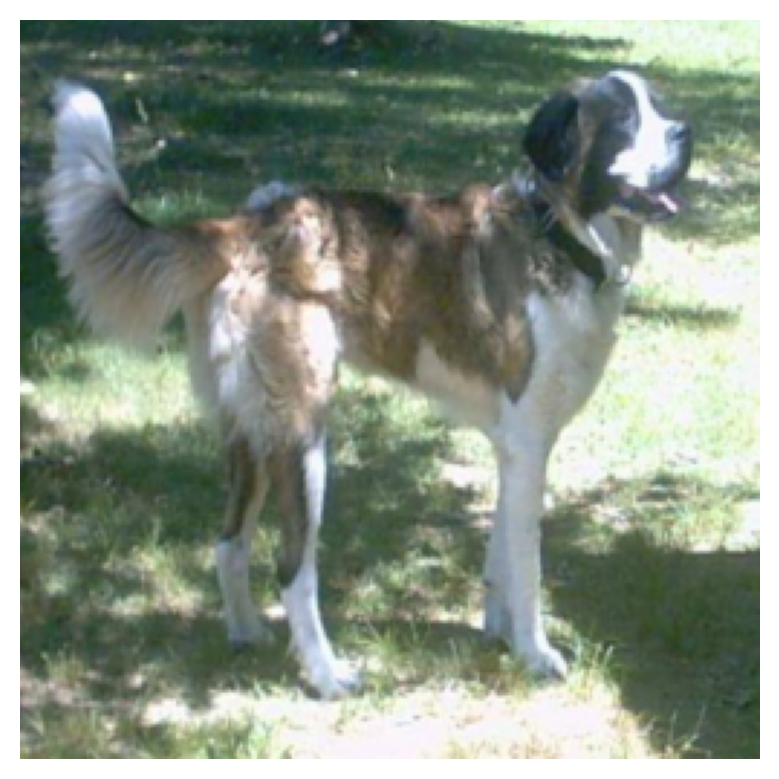

In [23]:
image = validation_dataset[10][0]
show_normalized_image(image)

Now, we are going to 'clip' our model at different points to get different intermediate representation.
Clip your model at two or three different points and plot the filters output.

In order to clip the model, you can use `model.children()` method. For example, to get output only after the first 4 layers, you can do:

```
clipped = nn.Sequential(
    *list(model.children()[:4])
)
intermediate_output = clipped(input)
```



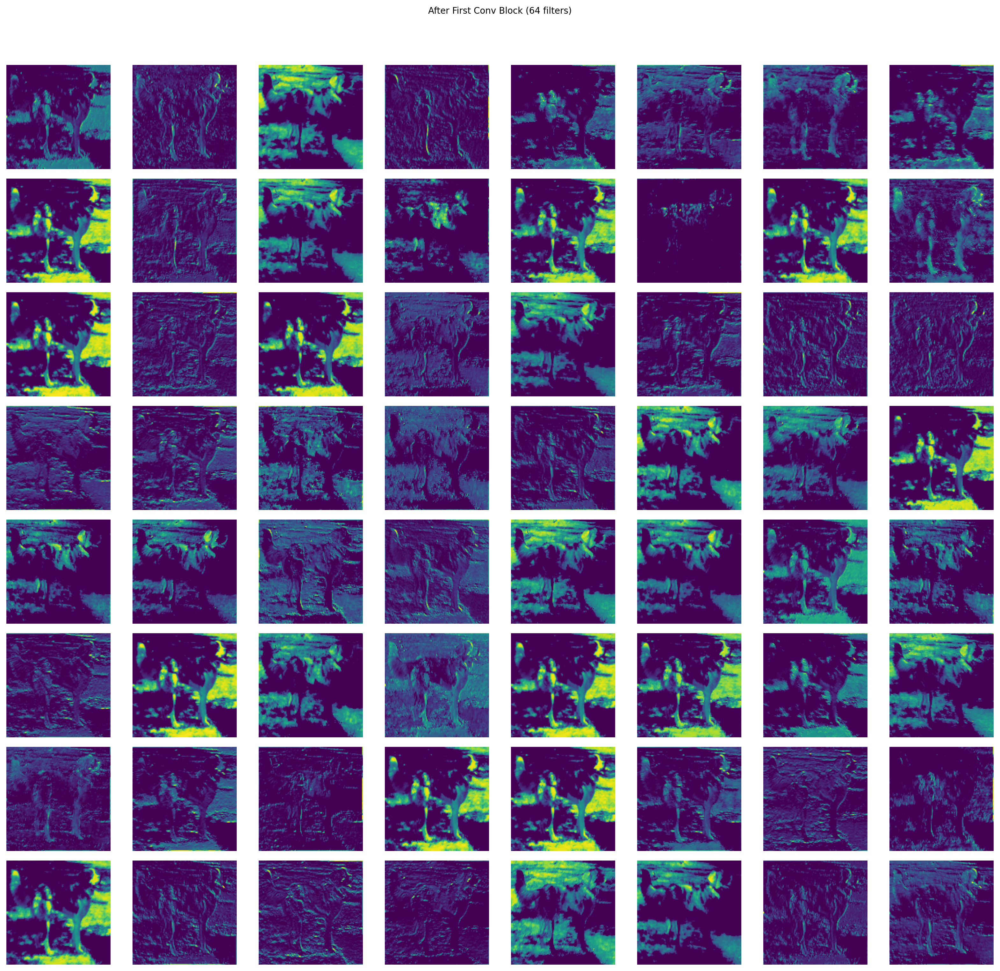

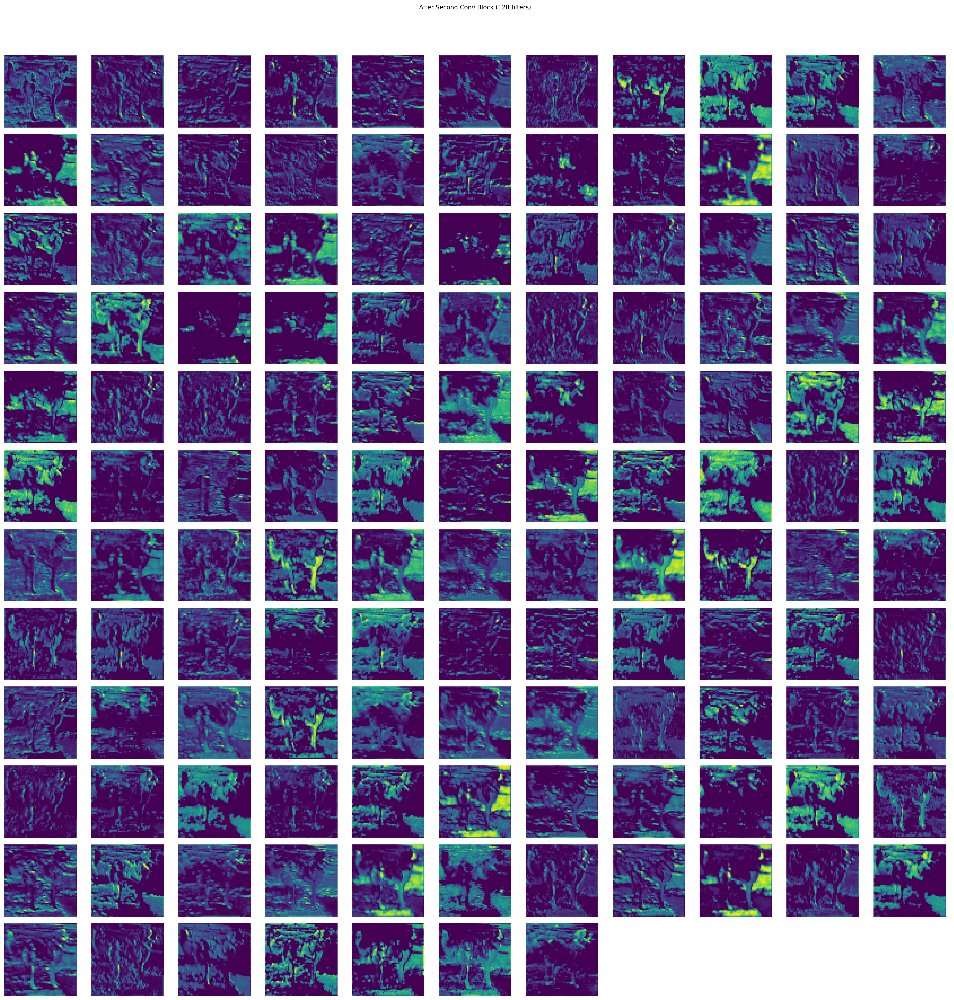

In [24]:
import math

def plot_intermediate_output(result, title):
  """ Plots the intermediate output of shape
      N_FILTERS x H x W
  """
  # Check if the input is a batch (N, C, H, W), take the first image
  if result.ndim == 4:
      result = result[0]

  n_filters = result.shape[0]
  # Calculate grid dimensions, aiming for a roughly square layout
  N = math.ceil(math.sqrt(n_filters))
  M = math.ceil(n_filters / N)

  fig, axs = plt.subplots(N, M, figsize=(M*2, N*2)) # Adjust figure size
  fig.suptitle(title, fontsize=10) # Adjust title font size

  # Flatten the axes array for easier iteration
  axs = axs.flatten()

  for i in range(n_filters):
      axs[i].imshow(result[i].cpu().detach(), cmap='viridis') # Using viridis cmap for better visualization
      axs[i].axis('off')

  # Turn off any unused subplots
  for j in range(n_filters, len(axs)):
      axs[j].axis('off')

  plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
  plt.show()


# Get an image for visualization
image = validation_dataset[10][0]
image_batch = image.unsqueeze(0).to(device)

# Ensure model is on the correct device and in evaluation mode
model.to(device)
model.eval()

# TODO:
# pick a few intermediate representations from your network and plot them using
# the provided function.

with torch.no_grad():
    # After first convolutional block (conv1 -> bn1 -> relu -> pool1)
    # Output channels: 64
    output1 = model.pool1(F.relu(model.bn1(model.conv1(image_batch))))
    plot_intermediate_output(output1, f"After First Conv Block ({output1.shape[1]} filters)")

    # After second convolutional block (conv2 -> bn2 -> relu -> pool2)
    # This block operates on the output of the first block, so we need to chain them
    # Output channels: 128
    output2_input = model.pool1(F.relu(model.bn1(model.conv1(image_batch))))
    output2 = model.pool2(F.relu(model.bn2(model.conv2(output2_input))))
    plot_intermediate_output(output2, f"After Second Conv Block ({output2.shape[1]} filters)")

    # After the first residual block and pooling (conv3, res_proj, relu, pool4)
    # Input is output from block 2 (128 channels)
    # Main path: conv3 (stride 2, 128->256) -> bn3 -> relu
    # Residual path: res_proj (stride 2, 128->256)
    # Add paths -> relu
    # Then conv4 (256->512) -> bn4 -> relu -> pool4
    output3_input = model.pool2(F.relu(model.bn2(model.conv2(model.pool1(F.relu(model.bn1(model.conv1(image_batch))))))))
    res3 = model.res_proj(output3_input)
    x3 = F.relu(model.bn3(model.conv3(output3_input)))
    x3 = F.relu(x3 + res3) # After first residual addition
    output3 = model.pool4(F.relu(model.bn4(model.conv4(x3)))) # After conv4 and pool4
    plot_intermediate_output(output3, f"After First Residual Block + Conv4/Pool4 ({output3.shape[1]} filters)")

    # After the second residual block (conv5, res5_proj, relu)
    # Input is output from previous step (output3, 512 channels)
    # Main path: conv5 (stride 2, 512->1024) -> bn5 -> relu
    # Residual path: res5_proj (stride 2, 512->1024)
    # Add paths -> relu
    # Break down the calculation for the input to the second residual block
    x = model.pool1(F.relu(model.bn1(model.conv1(image_batch))))
    x = model.pool2(F.relu(model.bn2(model.conv2(x))))
    res = model.res_proj(x)
    x = F.relu(model.bn3(model.conv3(x)))
    x = F.relu(x + res)
    output4_input = model.pool4(F.relu(model.bn4(model.conv4(x))))

    res4 = model.res5_proj(output4_input)
    x4 = F.relu(model.bn5(model.conv5(output4_input)))
    output4 = F.relu(x4 + res4) # After second residual addition
    plot_intermediate_output(output4, f"After Second Residual Block ({output4.shape[1]} filters)")

What can you say about those filters? What features are they focusing on?

Answer:
The convolutional filters at different layers learn hierarchical features:

**Early Layers (First Conv Block - 32 filters):**
- These filters typically detect low-level features like edges, corners, and simple textures
- They respond to basic patterns like horizontal/vertical lines, curves, and color gradients
- The activations show localized, fine-grained patterns that form the building blocks for more complex features

**Middle Layers (Second Conv Block - 64 filters):**
- These filters combine the low-level features to detect more complex patterns
- They might detect shapes like circles, triangles, or specific textures (fur patterns, whiskers)
- The activations show more structured patterns that are still somewhat localized

**Later Layers (Third Conv Block - 128 filters):**
- These filters detect high-level, semantic features
- They respond to complex patterns like faces, ears, eyes, or body parts
- The activations show more global, object-like patterns that are closer to the final classification

**Key Observations:**
1. **Hierarchical Learning**: Each layer builds upon the previous layer's features
2. **Feature Complexity**: Features become more complex and semantic as we go deeper
3. **Receptive Field**: Later layers have larger receptive fields and can see more of the image
4. **Specialization**: Different filters specialize in different aspects (some for edges, some for textures, some for shapes)
5. **Cat vs Dog Features**: The network learns to distinguish features that are characteristic of cats (pointed ears, whiskers) vs dogs (floppy ears, different facial structures)

This hierarchical feature learning is what makes CNNs so effective for image classification - they automatically learn to extract relevant features at multiple levels of abstraction.